# PART A – Time Series Analysis

Based on the work of the Climate Institute of the University of East Anglia two datafiles have been provided and
are uploaded on Moodle: The datafile ‘nitm18442004.csv’ represents a monthly time series of average
temperatures in Armagh from January 1844 to December 2004. The datafile ‘nity18442004.csv’ is a condensed
version of the same data giving a timeseries of yearly average temperatures from 1844 to 2004. Both timeseries
have different characteristics.

You are required to estimate and report on suitable models for both time series. Your report should contain the
following elements:

• A preliminary assessment of the nature and components of the raw time series, using visualisations as
appropriate.

• Estimation and discussion of suitable time series models from each of the categories listed below.
Appropriate diagnostic tests and checks should be undertaken. 

i. Exponential Smoothing

ii. ARIMA/SARIMA

iii. Simple time series models

• Use the data up to and including 2003 as training set to forecast the average temperatures for 2004 and
the actual data for 2004 as a test set to evaluate the forecast for the year. Use the monthly temperature
data to forecast 12 months and the yearly temperature data to forecast for 1 year. Evaluate the
forecasts against the actual data for 2004. Discuss your choice of an ‘optimum’ model for
this series, from the above, which you should use to forecast. Provide commentary on the
adequacy of your model for forecasting purposes.

### 1. Preliminary assessment of the nature and components of the raw time series, using visualisations


#### 1.1 Monthly time series


In [1]:
# Import the nitm18442004 dataset
dfm <- read.csv("nitm18442004.csv", header = TRUE)
head(dfm)

,x
,<dbl>
1,4.5
2,2.4
3,4.8
4,9.1
5,10.9
6,12.9


##### 1.1.1 Create Time Series

Creating a time series object called tsm. The function takes as input the average monthly temperatures, and sets the start date of the time series to January 1844, with a frequency of 12, indicating that the data is monthly.

In [2]:
# Create a time series object
tsm <- ts(dfm$x, start = c(1844, 1), frequency = 12)


##### 1.1.2 Visualize

Creating a plot to visualize the time series

We can observe that we have seasonality in our data(further visual analysis will be conducted). The high spikes in the middle of the year and low spikes at the end/beginning of the year suggest that there is a recurring pattern in the data that follows a seasonal cycle. The seasonality in the tsm plot indicates that there is a pattern that repeats itself over a fixed period of time, and this pattern is likely linked to the seasonal variations in temperature. Seasonality can be caused by a number of factors, including changes in the amount of sunlight, changes in the weather patterns, and variations in the amount of precipitation. By observing the seasonality in the tsm plot, we can gain insights into the underlying factors that are driving the temperature patterns over time. However, further analysis is needed so more visualizations will be following in the next lines

Double click the plot to enlarge

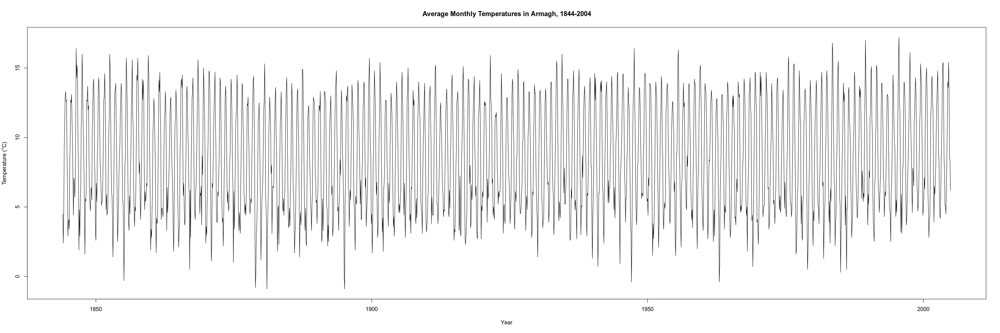

In [3]:
# Set the plot size
options(repr.plot.width = 30, repr.plot.height = 10)

# Plot the time series
plot(tsm, main = "Average Monthly Temperatures in Armagh, 1844-2004",
     xlab = "Year", ylab = "Temperature (°C)")

##### 1.1.3 Creating a box plot to visualize the median, quartiles, and outliers

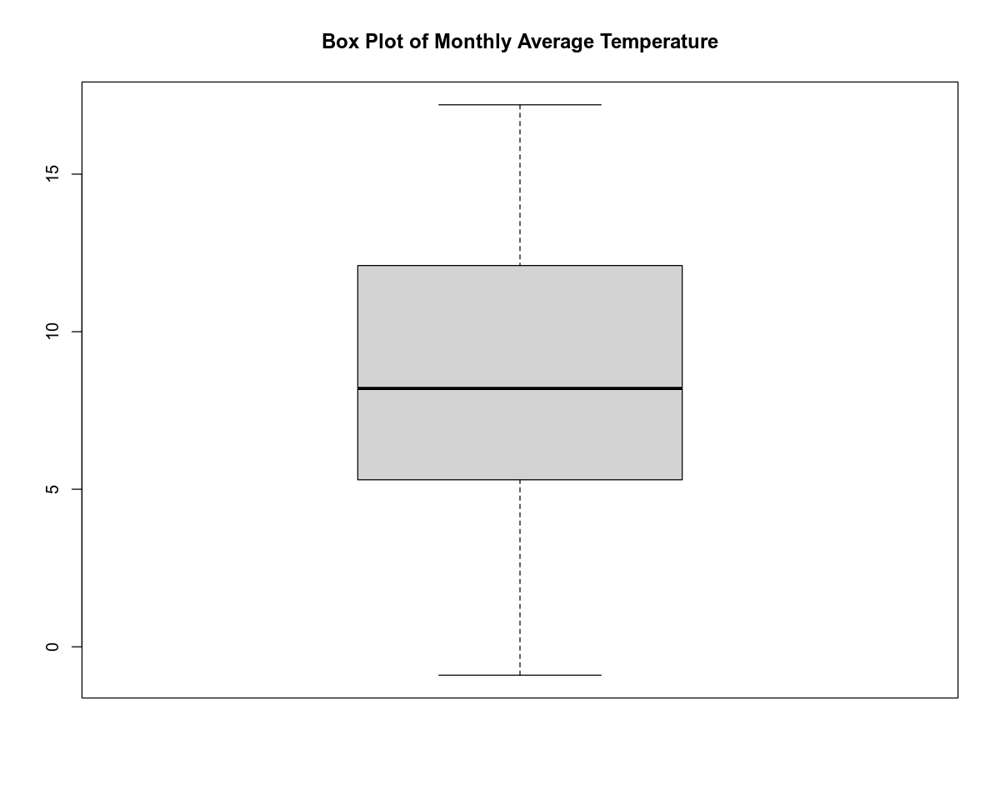

In [4]:
# Set the plot size
options(repr.plot.width = 10, repr.plot.height = 8)

# Box plot of tsm
boxplot(tsm, main = "Box Plot of Monthly Average Temperature")

The boxplot shows that the data points in the time series fall within the whiskers of the box plot, which represent the interquartile range. This suggests that the data is relatively tightly clustered around the median, and there are no extreme values that are significantly different from the rest of the data.






##### 1.1.4 Decomposition plot

Using the decomposition plot to visualize the individual components of the time series (trend, seasonality, and residual). It is useful for identifying any trends or seasonality that may not be apparent in the raw data.


Warning message:
“Removed 24 rows containing missing values (`geom_line()`).”


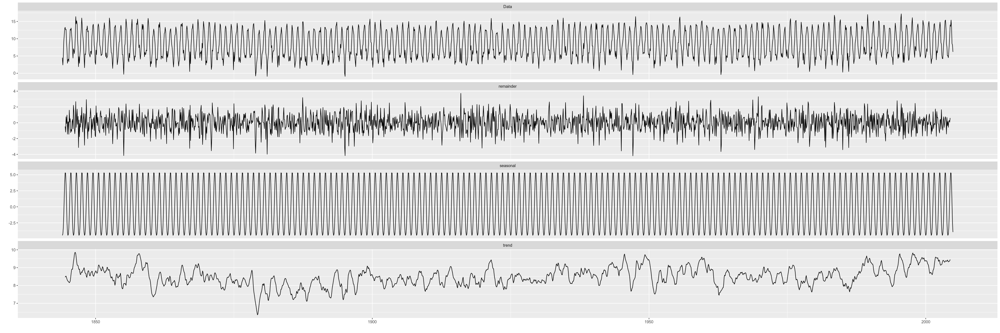

In [5]:
# load libraries
library(ggplot2)
library(ggfortify)

# decompose the time series
tsm_decomp <- decompose(tsm)

# plot the decomposition
options(repr.plot.width=30, repr.plot.height=10)
autoplot(tsm_decomp)

- Data: This is the original time series and discussed in the above visualisations

- Remainder: shows the part of the time series that cannot be explained by the trend or seasonal components. There are no noticeable patterns in the remainder plot, which suggests that the model is capturing the underlying patterns in the data

- Seasonal: shows the regular pattern that repeats itself over a fixed period of time. The seasonal component is relatively large and indicates that the seasonality is an important factor in the time series.

- Trend: This component shows the long-term trend of the time series. The fluctuations in my graph are relatively small and clustered around a stable line, this suggests that the trend component of the time series is relatively small and not very pronounced.

#### 1. 2 Yearly time series

In [6]:
# Import the nity18442004 dataset
dfy <- read.csv("nity18442004.csv", header = TRUE)
head(dfy)

,x
,<dbl>
1,8.5
2,8.3
3,9.7
4,8.9
5,8.5
6,8.7


##### 1.2.1 Create Time Series

Creating a time series object called tsy. The function takes as input the average yearly temperatures, and sets the start date of the time series to 1844, with a frequency of 1, indicating that the data is yearly.

In [7]:
# Create a time series object for the yearly average temperatures
tsy <- ts(dfy$x, start = c(1844,1), frequency = 1)
print(tsy)

Time Series:
Start = 1844 
End = 2004 
Frequency = 1 
  [1] 8.5 8.3 9.7 8.9 8.5 8.7 9.0 8.8 8.9 8.0 8.7 8.0 8.7 9.5 8.8 9.0 7.3 8.6
 [19] 8.0 8.5 8.0 8.8 8.3 8.2 9.1 8.6 8.3 8.6 8.2 7.9 8.3 8.4 8.2 7.9 8.1 6.7
 [37] 8.2 7.4 8.2 7.7 8.3 7.5 7.5 7.8 7.6 8.3 8.2 7.9 7.2 8.8 8.1 7.5 8.4 8.3
 [55] 8.9 8.8 8.4 8.2 8.0 8.2 8.2 8.4 8.4 8.0 8.8 7.8 8.3 8.7 8.1 8.5 8.7 7.9
 [73] 8.4 7.9 8.6 7.8 8.7 9.5 7.8 8.2 8.3 8.1 8.7 8.3 8.5 8.2 8.2 8.3 8.6 9.0
 [91] 8.9 8.6 8.4 8.5 9.0 8.7 8.5 8.5 8.5 9.2 8.9 9.6 8.5 8.4 9.0 9.6 8.4 8.2
[109] 8.1 9.1 8.4 8.8 8.6 9.1 8.7 9.5 8.7 8.9 8.0 7.8 8.8 8.1 8.6 8.7 8.6 8.2
[127] 8.6 9.0 8.0 8.6 8.2 9.0 8.6 8.2 8.5 7.6 8.4 8.4 8.7 9.0 8.6 8.0 7.8 8.3
[145] 8.9 9.3 9.2 8.7 8.7 8.5 8.7 9.5 8.5 9.6 9.4 9.5 9.2 8.8 9.5 9.3 9.5


##### 1.2.2 Visualize

Creating a plot to visualize the time series

Based on the line plot of the time series, it appears that there is no clear trend over time. The data points appear to be scattered randomly around the average value without any noticeable upward or downward trend. Therefore, we can conclude that the time series does not exhibit any significant trend.

In addition, it appears that there is no clear indication of seasonality or repeating patterns at regular intervals. The data points appear to be randomly distributed over time with no obvious peaks or valleys in specific  years. Therefore, it can be concluded that this time series does not exhibit seasonality or any patterns repeated at regular intervals.

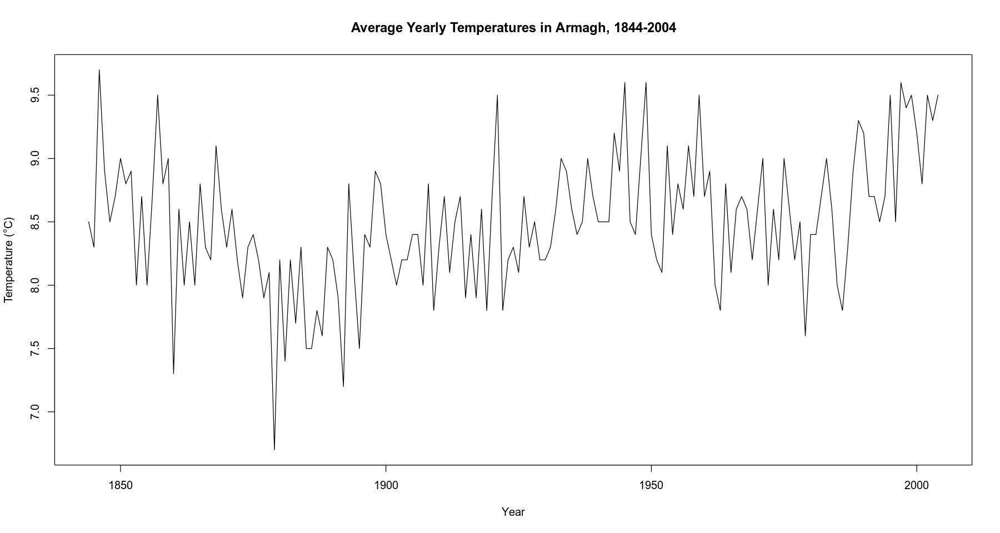

In [8]:
# Set the plot size
options(repr.plot.width = 15, repr.plot.height = 8)

# Plot the time series
plot(tsy, main = "Average Yearly Temperatures in Armagh, 1844-2004",
     xlab = "Year", ylab = "Temperature (°C)")

Creating a box plot to visualize the median, quartiles, and outliers

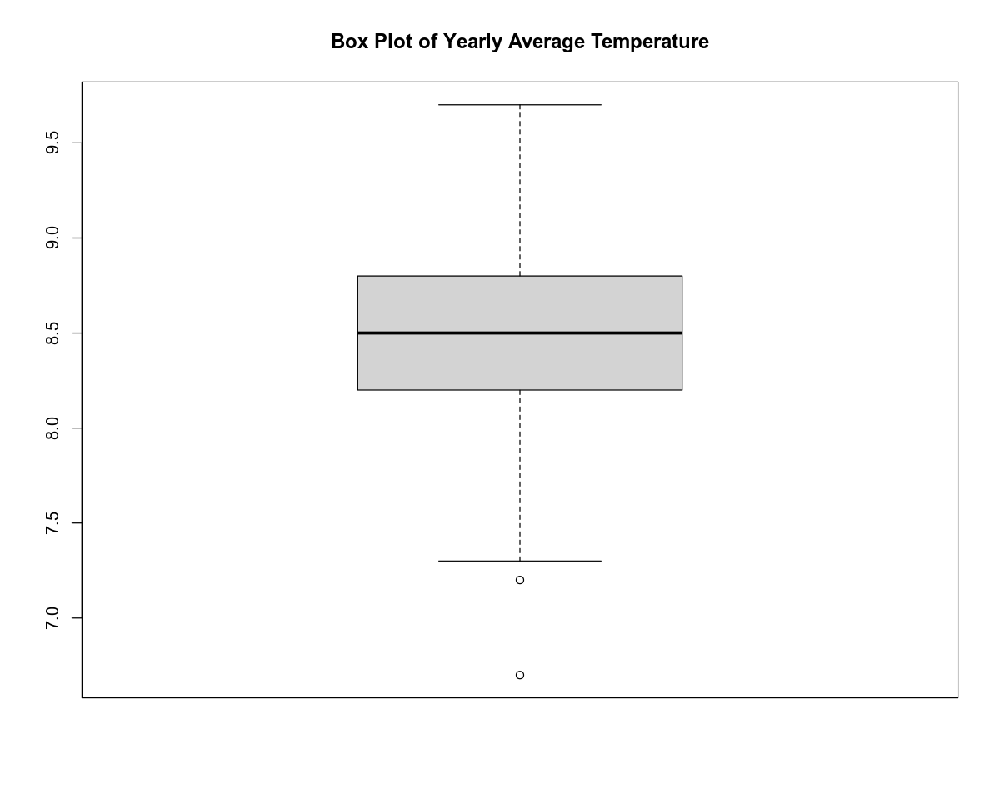

In [9]:
# Set the plot size
options(repr.plot.width = 10, repr.plot.height = 8)

# Box plot of tsy
boxplot(tsy, main = "Box Plot of Yearly Average Temperature")

Having 2 outliers in the boxplot means that the majority of the yearly average temperature values fall within a relatively narrow range. It is possible that the two outliers indicate unusual or extreme temperature values for those years.

### 2. Diagnostic tests and checks 

After visualizing the time series data, the next important step is to perform diagnostic tests and checks to determine the most suitable time series model. This involves checking for stationarity, identifying trends and seasonality, and detecting any autocorrelation or residual patterns in the data. 

#### 2.1 Monthly time series

Starting first with the diagnostic tests and checks for the monthly average temperature time series

Performing Autocorrelation function (ACF) and partial autocorrelation function (PACF) that would give useful information about the seasonality of tsm time series. 

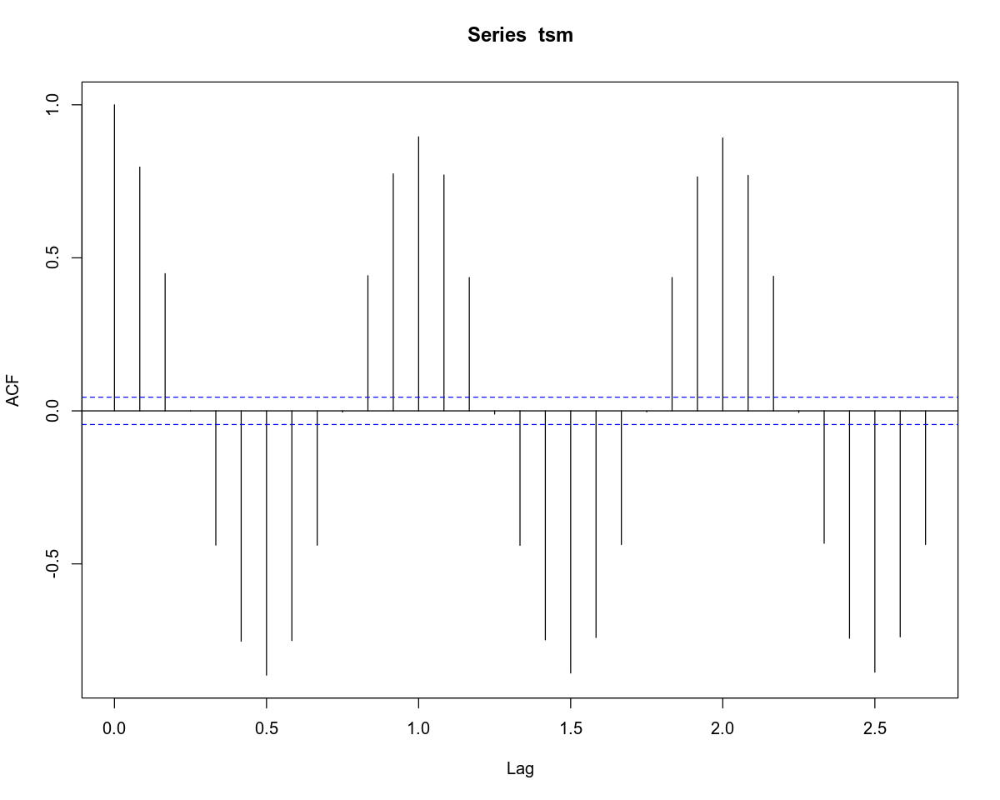

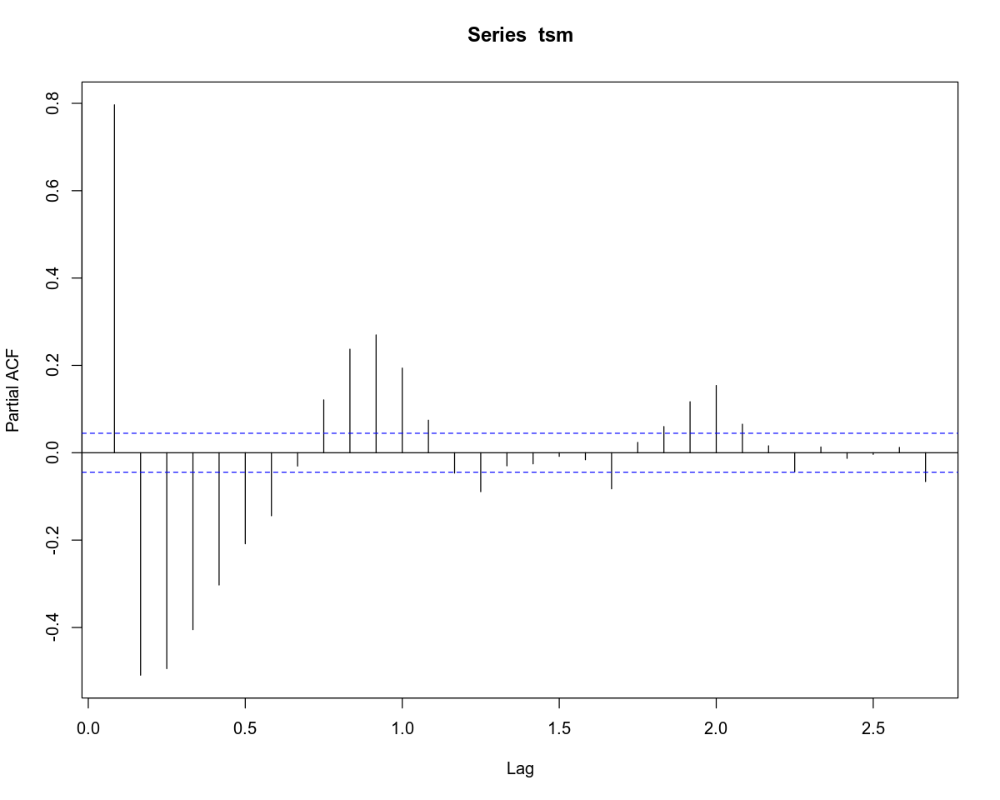

In [10]:
library(ggfortify)

# Calculate ACF and PACF for time series
tsm_acf <- acf(tsm)
tsm_pacf <- pacf(tsm)


- ACF: the plot shows the correlation between a time series and its lagged values, while the lag plot shows the correlation between a time series and its lagged differences. The ACF plot has 5 spikes followed by 5 troughs and so on, it suggests that there is a repeating pattern or seasonality in the data that occurs every 5 lags. This could mean that the time series has a seasonal component that is repeating every 5 months. 

- Performing ADF test to checkif time series is stationary or not

In [11]:
library(urca)

# Perform ADF test
adf_test <- ur.df(tsm, type="trend", selectlags="AIC")

# Print test results
summary(adf_test)


############################################### 
# Augmented Dickey-Fuller Test Unit Root Test # 
############################################### 

Test regression trend 


Call:
lm(formula = z.diff ~ z.lag.1 + 1 + tt + z.diff.lag)

Residuals:
   Min     1Q Median     3Q    Max 
-7.057 -1.312  0.037  1.386  6.048 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.536e+00  1.369e-01  18.527   <2e-16 ***
z.lag.1     -3.076e-01  1.250e-02 -24.613   <2e-16 ***
tt           8.435e-05  8.135e-05   1.037      0.3    
z.diff.lag   5.099e-01  1.959e-02  26.025   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.989 on 1926 degrees of freedom
Multiple R-squared:  0.3358,	Adjusted R-squared:  0.3348 
F-statistic: 324.6 on 3 and 1926 DF,  p-value: < 2.2e-16


Value of test-statistic is: -24.6126 201.9339 302.9004 

Critical values for test statistics: 
      1pct  5pct 10pct
tau3 -3.96 -3.41 -3.12
phi2  6.0

- The Augmented Dickey-Fuller (ADF) test is a common statistical test to determine if a time series is stationary or not. The test is based on the null hypothesis that the time series contains a unit root, indicating that the series is non-stationary. The alternative hypothesis is that the time series is stationary. Looking at the results of the ADF test, we see that the value of the test statistic (-24.6126) is much lower than the critical values for all levels of significance. Additionally, the p-value is < 2.2e-16, indicating that we can reject the null hypothesis and conclude that the time series is stationary at the 1%, 5%, and 10% levels of significance. So, we can say that the time series is stationary.

#### 2.2 Yearly time series

Moving on with the diagnostic tests and checks for the yearly average temperature time series

- Performing Autocorrelation function (ACF) and partial autocorrelation function (PACF) 

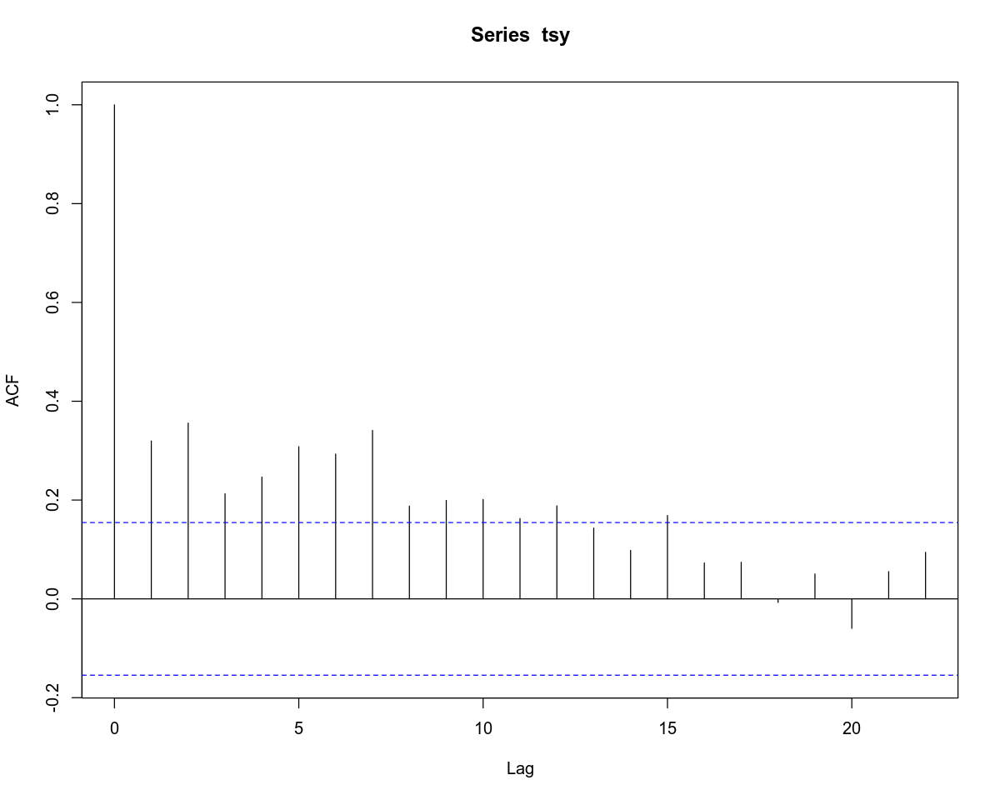

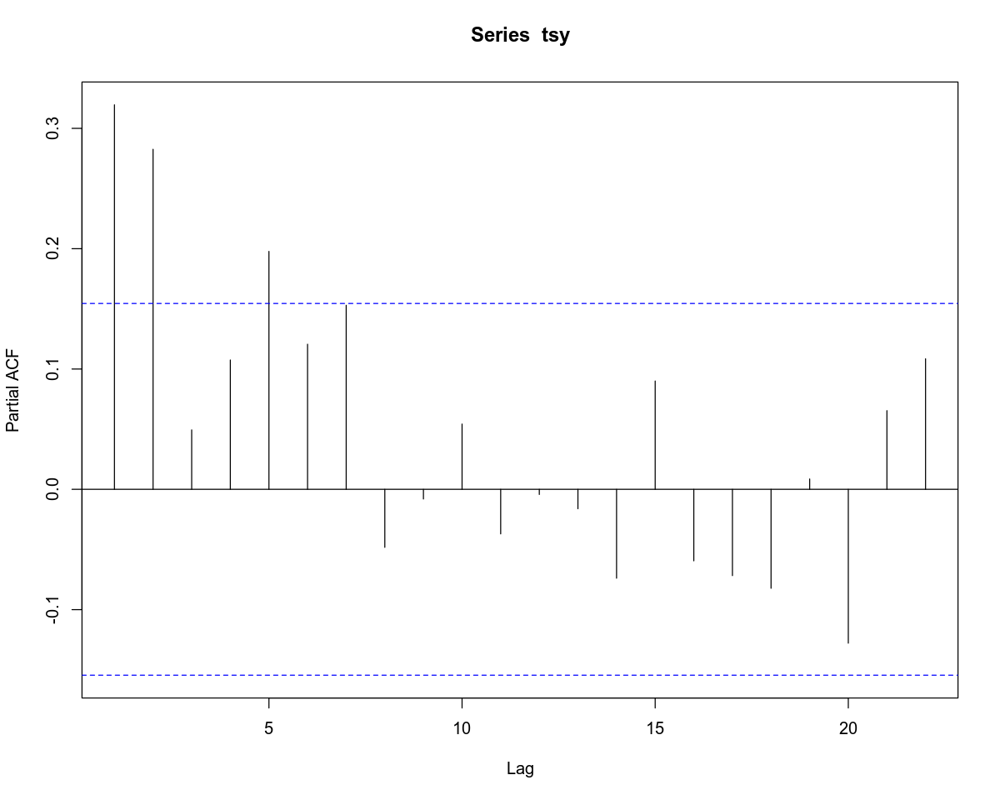

In [12]:
library(ggfortify)

# Calculate ACF and PACF for time series
tsy_acf <- acf(tsy)
tsy_pacf <- pacf(tsy)

- ACF: it seems that the ACF plot for the average yearly temperature time series has a significant peak at lag 1, which may suggest a strong correlation between adjacent time points. The small wave from lags 2 to 15 suggests that there might be some seasonality in the data, but the pattern is not very clear. The last lines at lag 15-endsuggest that there may be some weak correlation between points separated by multiple lags, but the values are very small, indicating that there might not be much correlation at those lags. Overall, the ACF plot does not provide a clear indication of strong seasonality or trend in the data.

- Performing ADF test to check if time series is stationary or not

In [13]:
library(urca)

# Perform ADF test
adf_test <- ur.df(tsy, type="trend", selectlags="AIC")

# Print test results
summary(adf_test)


############################################### 
# Augmented Dickey-Fuller Test Unit Root Test # 
############################################### 

Test regression trend 


Call:
lm(formula = z.diff ~ z.lag.1 + 1 + tt + z.diff.lag)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.47027 -0.28191 -0.01617  0.32634  1.41021 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.5374228  0.7930494   5.721 5.30e-08 ***
z.lag.1     -0.5545698  0.0961759  -5.766 4.26e-08 ***
tt           0.0021665  0.0008802   2.461   0.0149 *  
z.diff.lag  -0.2548266  0.0783048  -3.254   0.0014 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.4738 on 155 degrees of freedom
Multiple R-squared:  0.4108,	Adjusted R-squared:  0.3994 
F-statistic: 36.03 on 3 and 155 DF,  p-value: < 2.2e-16


Value of test-statistic is: -5.7662 11.1533 16.6929 

Critical values for test statistics: 
      1pct  5pct 10pct
tau3 -3.99 -3.43

- The Augmented Dickey-Fuller (ADF) test is a popular statistical test used to determine whether a time series has a unit root, which implies that the series is non-stationary. We can see that the test regression includes a trend variable, indicated by the "tt" variable in the model. The ADF test statistic is -5.7662, which is smaller than the critical values at the 1% level for all three test statistics, suggesting that the time series is stationary.


### 3. Estimation and discussion of suitable time series models 
- Exponential Smoothing
- ARIMA/SARIMA
- Simple time series models

#### 3.1 Exponential Smoothing

##### 3.1.1 Simple exponential smoothing

###### - Monthly Time Series(tsm)

In [14]:
library(forecast)
# perform simple exponential smoothing
ses_model_m <- ses(tsm)

# print the summary of the model
summary(ses_model_m)

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Registered S3 methods overwritten by 'forecast':
  method                 from     
  autoplot.Arima         ggfortify
  autoplot.acf           ggfortify
  autoplot.ar            ggfortify
  autoplot.bats          ggfortify
  autoplot.decomposed.ts ggfortify
  autoplot.ets           ggfortify
  autoplot.forecast      ggfortify
  autoplot.stl           ggfortify
  autoplot.ts            ggfortify
  fitted.ar              ggfortify
  fortify.ts             ggfortify
  residuals.ar           ggfortify




Forecast method: Simple exponential smoothing

Model Information:
Simple exponential smoothing 

Call:
 ses(y = tsm) 

  Smoothing parameters:
    alpha = 0.9999 

  Initial states:
    l = 4.5107 

  sigma:  2.4384

     AIC     AICc      BIC 
18066.33 18066.34 18083.02 

Error measures:
                       ME    RMSE      MAE  MPE MAPE     MASE      ACF1
Training set 0.0008745644 2.43718 2.011637 -Inf  Inf 1.513398 0.3562067

Forecasts:
         Point Forecast       Lo 80    Hi 80      Lo 95    Hi 95
Jan 2005         6.2002  3.07520967  9.32519  1.4209397 10.97946
Feb 2005         6.2002  1.78101729 10.61938 -0.5583567 12.95876
Mar 2005         6.2002  0.78791887 11.61248 -2.0771697 14.47757
Apr 2005         6.2002 -0.04931185 12.44971 -3.3576036 15.75800
May 2005         6.2002 -0.78693172 13.18733 -4.4856959 16.88610
Jun 2005         6.2002 -1.45379379 13.85419 -5.5055734 17.90597
Jul 2005         6.2002 -2.06703849 14.46744 -6.4434502 18.84385
Aug 2005         6.2002 -2.637833

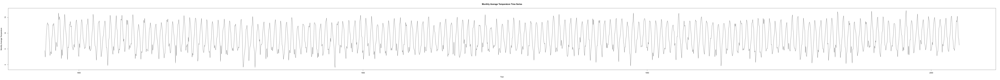

In [15]:
options(repr.plot.width = 100, repr.plot.height = 8)

# Plot time series data and SES forecast
plot(tsm, type = "l", col = "black", xlab = "Year", ylab = "Monthly Average Temperature",
     main = "Monthly Average Temperature Time Series")
lines(ses_model_m$mean[1:120], col = "black") # Plot original data in black
lines(ses_model_m$mean[121:130], col = "red") # Plot forecasted data for next 10 months in red

- The model uses a smoothing parameter (alpha) of 0.9999 and an initial level (l) of 4.5107. The value of sigma is 2.4384. AIC and AICc values are both 18066.33, and the BIC value is 18083.02.

- The error measures indicate that the model has a small mean error (ME) and root mean squared error (RMSE), indicating a good fit to the data. The mean absolute error (MAE) is 2.011637, which means that, on average, the model's forecast is off by about 2 units.

- The forecast provide estimates of the time series values for the next 10 months. The point forecast is 6.2002 for each month, and the confidence intervals indicate the range within which the actual value is likely to fall with a certain level of probability.

- Overall, the simple exponential smoothing model appears to provide a good fit to the data, as indicated by the small errors and good forecast accuracy. 

###### - Yearly Time Series(tsy)

In [16]:
library(forecast)
# perform simple exponential smoothing
ses_model_y <- ses(tsy)

# print the summary of the model
summary(ses_model_y)


Forecast method: Simple exponential smoothing

Model Information:
Simple exponential smoothing 

Call:
 ses(y = tsy) 

  Smoothing parameters:
    alpha = 0.1718 

  Initial states:
    l = 8.7121 

  sigma:  0.463

     AIC     AICc      BIC 
574.1205 574.2734 583.3647 

Error measures:
                     ME      RMSE       MAE         MPE     MAPE      MASE
Training set 0.01810756 0.4600809 0.3531495 -0.07230435 4.191125 0.7188793
                    ACF1
Training set -0.03297106

Forecasts:
     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2005        9.21302 8.619706 9.806334 8.305624 10.12042
2006        9.21302 8.611010 9.815030 8.292325 10.13372
2007        9.21302 8.602437 9.823603 8.279214 10.14683
2008        9.21302 8.593983 9.832056 8.266285 10.15975
2009        9.21302 8.585644 9.840396 8.253531 10.17251
2010        9.21302 8.577413 9.848627 8.240943 10.18510
2011        9.21302 8.569288 9.856752 8.228517 10.19752
2012        9.21302 8.561264 9.864776 8.216246 10.

- The smoothing parameter is estimated at 0.1718. The initial level is estimated at 8.7121. The model's sigma is 0.463.
- The model diagnostics show that the model fits the data relatively well, with a small root mean squared error of 0.460 and a mean absolute percentage error of 4.19%. The mean absolute scaled error MASE is 0.719, which indicates that the model outperforms a naive model that uses the previous observation as the forecast for all future periods.

- The forecasts produced by the model indicate that the temperature is expected to remain relatively stable over the next 10 years, with an average temperature of 9.213°C. The 80% and 95% prediction intervals are provided to give an idea of the range of uncertainty in the forecasts.


##### 3.1.2 Holt's linear exponential smoothing

Holt's linear exponential smoothing is a forecasting method that is an extension of the simple exponential smoothing method. It is used to forecast time series data that exhibits a trend. The method models the time series as a linear function of time, and applies exponential smoothing to the level and slope of the series.

###### - Monthly Time Series(tsm)

In [17]:
library(forecast)

# Fit a Holt's linear exponential smoothing model
holt_model_m <- holt(tsm)

# Print the summary of the model
summary(holt_model_m)

# Generate a forecast for the next 10 months
holt_fcast_m <- forecast(holt_model_m, h = 10)

# Print the forecasted values
holt_fcast_m


Forecast method: Holt's method

Model Information:
Holt's method 

Call:
 holt(y = tsm) 

  Smoothing parameters:
    alpha = 0.9999 
    beta  = 9e-04 

  Initial states:
    l = 6.5675 
    b = 0.1634 

  sigma:  2.4428

     AIC     AICc      BIC 
18075.15 18075.18 18102.98 

Error measures:
                      ME     RMSE      MAE  MPE MAPE     MASE      ACF1
Training set -0.07660972 2.440225 2.012702 -Inf  Inf 1.514199 0.3565739

Forecasts:
         Point Forecast       Lo 80     Hi 80      Lo 95    Hi 95
Jan 2005       6.225013  3.09449562  9.355529  1.4373001 11.01273
Feb 2005       6.249822  1.82075192 10.678893 -0.5238564 13.02350
Mar 2005       6.274632  0.84770268 11.701562 -2.0251403 14.57440
Apr 2005       6.299442  0.03008399 12.568800 -3.2887138 15.88760
May 2005       6.324252 -0.68834687 13.336851 -4.4005925 17.04910
Jun 2005       6.349062 -1.33642159 14.034545 -5.4048708 18.10299
Jul 2005       6.373872 -1.93125969 14.679003 -6.3277307 19.07547
Aug 2005       6.39

         Point Forecast       Lo 80     Hi 80      Lo 95    Hi 95
Jan 2005       6.225013  3.09449562  9.355529  1.4373001 11.01273
Feb 2005       6.249822  1.82075192 10.678893 -0.5238564 13.02350
Mar 2005       6.274632  0.84770268 11.701562 -2.0251403 14.57440
Apr 2005       6.299442  0.03008399 12.568800 -3.2887138 15.88760
May 2005       6.324252 -0.68834687 13.336851 -4.4005925 17.04910
Jun 2005       6.349062 -1.33642159 14.034545 -5.4048708 18.10299
Jul 2005       6.373872 -1.93125969 14.679003 -6.3277307 19.07547
Aug 2005       6.398682 -2.48401033 15.281374 -7.1862234 19.98359
Sep 2005       6.423492 -3.00241418 15.849397 -7.9921873 20.83917
Oct 2005       6.448301 -3.49210454 16.388707 -8.7542376 21.65084

- ME (Mean Error) is -0.0766, indicating that on average the forecasts underestimate the actual values.
- RMSE (Root Mean Squared Error) is 2.4402, indicating that the model's forecasts deviate from the actual values by an average of 2.4402 units.
- MAE (Mean Absolute Error) is 2.0127, indicating that the model's forecasts deviate from the actual values by an average of 2.0127 units.
- MPE (Mean Percentage Error) is -Inf, indicating that the model's forecasts are biased towards underestimating the actual values.
- MAPE (Mean Absolute Percentage Error) is Inf, indicating that the model's forecasts have large percentage errors.
- MASE (Mean Absolute Scaled Error) is 1.5142, indicating that the model's forecasts are 1.5142 times better than a naive forecast.

- Overall, these error measures suggest that the Holt's method model is not performing very well on the monthly average time series, as the forecasts tend to underestimate the actual values and have high levels of error. However, the MASE indicates that the model is performing slightly better than a naive forecast. It may be worth exploring other forecasting methods to see if they can provide better results.

###### - Yearly Time Series(tsy)

In [18]:
library(forecast)

# Fit a Holt's linear exponential smoothing model
holt_model_y <- holt(tsy)

# Print the summary of the model
summary(holt_model_y)

# Generate a forecast 
holt_fcast_y <- forecast(holt_model_y, h = 1)

# Print the forecasted values
holt_fcast_y


Forecast method: Holt's method

Model Information:
Holt's method 

Call:
 holt(y = tsy) 

  Smoothing parameters:
    alpha = 0.1544 
    beta  = 1e-04 

  Initial states:
    l = 8.7216 
    b = 0.0028 

  sigma:  0.466

     AIC     AICc      BIC 
578.1560 578.5431 593.5630 

Error measures:
                      ME      RMSE       MAE        MPE     MAPE      MASE
Training set 0.003011364 0.4601316 0.3517254 -0.2539131 4.181915 0.7159805
                    ACF1
Training set -0.01359256

Forecasts:
     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2005       9.202808 8.605661 9.799956 8.289551 10.11607
2006       9.205647 8.601415 9.809880 8.281554 10.12974
2007       9.208486 8.597242 9.819731 8.273669 10.14330
2008       9.211325 8.593139 9.829511 8.265892 10.15676
2009       9.214164 8.589105 9.839224 8.258219 10.17011
2010       9.217003 8.585137 9.848870 8.250647 10.18336
2011       9.219842 8.581233 9.858452 8.243173 10.19651
2012       9.222681 8.577390 9.867973 8.2357

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2005       9.202808 8.605661 9.799956 8.289551 10.11607

- ME (Mean Error) is 0.003, indicating that the model's forecasts are slightly biased high, indicating that the forecasts from the model tend to be higher than the actual values on average

- RMSE (Root Mean Squared Error) is 0.460, which means that the average forecast error is around 0.46 units.

- MAE (Mean Absolute Error) is 0.352, which means that on average, the model's forecasts are off by 0.352 units.

- MPE (Mean Percentage Error) is -0.254, which means that the forecasts are slightly biased low as MPE is negative

- MAPE (Mean Absolute Percentage Error) is 4.182%, indicating that on average, the model's forecasts are off by 4.182%.

- MASE (Mean Absolute Scaled Error)is 0.716, indicating that the model's forecasts are better than the naive forecas as the value is less than 1

##### 3.1.3 Holt-Winters' additive and multiplicative exponential smoothing

###### - Monthly Time Series(tsm)


Forecast method: Holt-Winters' additive method

Model Information:
Holt-Winters' additive method 

Call:
 hw(y = tsm, seasonal = "additive") 

  Smoothing parameters:
    alpha = 0.0279 
    beta  = 1e-04 
    gamma = 1e-04 

  Initial states:
    l = 9.1426 
    b = -0.0013 
    s = -3.9396 -2.4636 0.5252 3.5057 5.273 5.3237
           3.9816 1.2271 -1.3557 -3.354 -4.246 -4.4775

  sigma:  1.2137

     AIC     AICc      BIC 
15384.48 15384.80 15479.11 

Error measures:
                     ME    RMSE       MAE  MPE MAPE      MASE      ACF1
Training set 0.01832575 1.20869 0.9436671 -Inf  Inf 0.7099412 0.1893591

Forecasts:
         Point Forecast     Lo 80     Hi 80     Lo 95     Hi 95
Jan 2005       4.917100  3.361648  6.472552  2.538241  7.295959
Feb 2005       5.150103  3.594043  6.706162  2.770315  7.529890
Mar 2005       6.045004  4.488333  7.601676  3.664281  8.425728
Apr 2005       8.045422  6.488135  9.602709  5.663757 10.427087
May 2005      10.630569  9.072662 12.188476  8.2

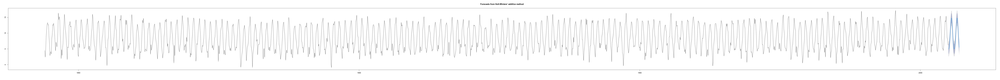

In [19]:
# Perform additive Holt-Winters' exponential smoothing
hw_add_m <- hw(tsm, seasonal = "additive")

# Print the summary of the forecast results
summary(hw_add_m)

# Visualize the forecasts and the original data
plot(hw_add_m)

In [20]:
# Perform multiplicative Holt-Winters' exponential smoothing
#hw_mult_m <- hw(tsm, seasonal = "multiplicative")

# Print the summary of the forecast results
#summary(hw_mult_m)

# Visualize the forecasts and the original data
#plot(hw_mult_m)

- Since there are negative average temperature values in the time series I cannot use multiplicative Holt-Winters' exponential smoothing because this method assumes that the seasonal fluctuations have a constant relative size, and this is not appropriate for data with negative values.

###### - Yearly Time Series(tsy)

In [21]:
# Perform additive Holt-Winters' exponential smoothing
# hw_add_y <- hw(tsy, seasonal = "additive")

# Print the summary of the forecast results
#summary(hw_add_y)

# Visualize the forecasts and the original data
# plot(hw_add_y)

ERROR message as the yearly time series is not suitable for this model

Error in hw(tsy, seasonal = "additive"): The time series should have frequency greater than 1.
Traceback:

1. hw(tsy, seasonal = "additive")
2. stop("The time series should have frequency greater than 1.")

- Holt-Winters' exponential smoothing is a popular method for time series forecasting, but it requires a time series with a frequency greater than 1. When the frequency is equal to 1, we cannot use this method because there is not enough data to detect any seasonal patterns or trends in the time series. Therefore, as I encountered the error message like "The time series should have frequency greater than 1", exponential smoothing method, it means that the method cannot be applied to the yearly average temperature time series

##### 3.1.4 Diagnostic tests AIC, BIC, and MASE

AIC, BIC, and MASE will be used as diagnostic tests to evaluate the performance of the exponential smoothing models

###### - Monthly Time Series(tsm)

In [22]:
# Define names of the models
model_names <- c("Simple exponential smoothing", "Holt's linear method", "Additive Holt-Winters")

# Create a list of models
models <- list(ses_model_m, holt_model_m, hw_add_m)

# Create an empty data frame to store the results
results <- data.frame(Model = character(),
                      AIC = numeric(),
                      BIC = numeric(),
                      MASE = numeric(),
                      stringsAsFactors = FALSE)

# Iterate through each model and calculate its AIC, BIC, and MASE values
for (i in seq_along(models)) {
  acc <- accuracy(models[[i]])
  results[i, "Model"] <- model_names[i]
  results[i, "AIC"] <- acc[2]
  results[i, "BIC"] <- acc[3]
  results[i, "MASE"] <- acc[6]
}

# Print the results table
print(results)

                         Model      AIC       BIC      MASE
1 Simple exponential smoothing 2.437180 2.0116365 1.5133977
2         Holt's linear method 2.440225 2.0127020 1.5141992
3        Additive Holt-Winters 1.208690 0.9436671 0.7099412


- The first model, Simple Exponential Smoothing (SES), has the highest AIC and BIC values, indicating that it has the worst fit among the three models. The MASE value of SES is also the highest, indicating that it has the highest error rate.

- Holt's Linear Method, has slightly lower AIC and BIC values than SES, but it still has a higher value compared to the third model. The MASE value of Holt's Linear Method is also slightly lower than SES, but it's still higher than the  Additive Holt-Winters.

- Additive Holt-Winters, has the lowest AIC and BIC values, indicating that it has the best fit among the three models. The MASE value of the Additive Holt-Winters model is also the lowest, indicating that it has the lowest error rate among the three models.

- Therefore, we can conclude that the Additive Holt-Winters model is the best model for the average monthly temperature time series. It has the lowest error rate and the best fit compared to the other two models.

###### - Yearly Time Series(tsy)

In [23]:
# Define names of the models
model_names <- c("Simple exponential smoothing", "Holt's linear method")


# Create a list of models
models <- list(ses_model_y, holt_model_y)

# Create an empty data frame to store the results
results <- data.frame(Model = character(),
                      AIC = numeric(),
                      BIC = numeric(),
                      MASE = numeric(),
                      stringsAsFactors = FALSE)

# Iterate through each model and calculate its AIC, BIC, and MASE values
for (i in seq_along(models)) {
  acc <- accuracy(models[[i]])
  results[i, "Model"] <- model_names[i]
  results[i, "AIC"] <- acc[2]
  results[i, "BIC"] <- acc[3]
  results[i, "MASE"] <- acc[6]
}

# Print the results table
print(results)

                         Model       AIC       BIC      MASE
1 Simple exponential smoothing 0.4600809 0.3531495 0.7188793
2         Holt's linear method 0.4601316 0.3517254 0.7159805


 For the average yearly temperature time series, we have two models: Simple Exponential Smoothing and Holt's Linear Method.

- Looking at the AIC and BIC values, we can see that both models have very similar values. However, the Simple Exponential Smoothing model has slightly lower values for AIC (0.4600809) and BIC (0.3531495) compared to Holt's Linear Method with AIC (0.4601316) and BIC (0.3517254).

- For the MASE value, we can see that Holt's Linear Method has a slightly lower value (0.7159805) compared to Simple Exponential Smoothing (0.7188793). This means that Holt's Linear Method has a slightly better out-of-sample forecast accuracy.

- However, the difference in MASE is very small, and the AIC and BIC values are quite similar for both models. 

#### 3.2 ARIMA/SARIMA

###### - Monthly Time Series(tsm)


Call:
arima(x = tsm, order = c(1, 1, 1), seasonal = list(order = c(1, 1, 1), period = 12))

Coefficients:
         ar1      ma1     sar1     sma1
      0.1994  -0.9843  -0.0116  -0.9780
s.e.  0.0228   0.0042   0.0236   0.0072

sigma^2 estimated as 1.422:  log likelihood = -3082.93,  aic = 6175.85

Training set error measures:
                     ME     RMSE       MAE  MPE MAPE      MASE         ACF1
Training set 0.02715187 1.188486 0.9251815 -Inf  Inf 0.4596983 -0.005501602


	Box-Ljung test

data:  sarima_model_m$residuals
X-squared = 21.714, df = 20, p-value = 0.3562


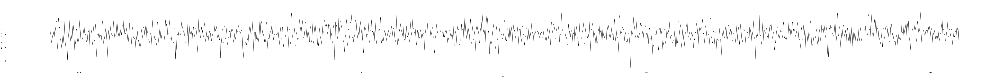

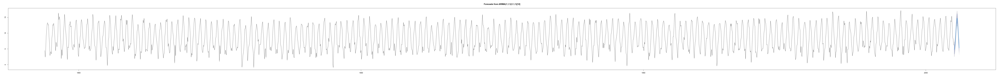

In [24]:
# Fit the SARIMA model
sarima_model_m <- arima(tsm, order = c(1,1,1), seasonal = list(order = c(1,1,1), period = 12))

# Print the model summary
summary(sarima_model_m)

# Plot the residuals
plot(sarima_model_m$residuals)

# Check the Ljung-Box test
Box.test(sarima_model_m$residuals, lag = 20, type = "Ljung-Box")

# Forecast future values
forecast_values_m <- forecast(sarima_model_m, h = 12)
plot(forecast_values_m)

- The SARIMA model has been fitted to the monthly average temperature time series data with order (1,1,1) for non-seasonal components and order (1,1,1) for seasonal components, with a seasonal period of 12 (monthly data). The coefficients of the model indicate that the first-order autoregressive and moving average  components and the seasonal AR and MA components are statistically significant.

- The estimated value of the sigma squared parameter is 1.422, and the log likelihood and AIC values are -3082.93 and 6175.85, respectively.
- ME is 0.027, indicating that, on average, the model overestimates the temperature by 0.027 degrees. 
- RMSE is 1.188, indicating that the model's average prediction error is 1.188 degrees. 
- MAE is 0.925, which is the average absolute difference between the actual and predicted values.
- MPE is negative infinity, indicating that the model has a tendency to underestimate the temperature. 
- MAPE is infinite, indicating that the model's predictions have a large percentage error.
- MASE is 0.46, which is the average error of the model relative to the naive method.
- ACF1 is -0.0055, indicating that the residuals of the model are not significantly correlated at lag 1.

- The Box-Ljung has been performed on the residuals of the SARIMA model, and the p-value is 0.3562, which is greater than the significance level of 0.05. Therefore, we can conclude that there is no evidence of residual autocorrelation in the model, and the model may be a good fit for predicting the average temperature of the next 12 months.

###### - Yearly Time Series(tsy)

The yearly average temperatures time series (tsy)was analyzed using the ACF and ADF tests to check for seasonality and stationarity, in the previous sections.  The results of the ACF test showed that there was no clear indication of strong seasonality or trend in the data, as the autocorrelation coefficients gradually decreased to zero. Furthermore, the ADF test statistic was found to be -5.7662, which is smaller than the critical values at the 1% level for all three test statistics. This suggests that the time series is stationary, which is a desirable property. Therefore, an ARIMA model can be used to forecast future values of the time series, as there is no strong evidence of seasonality or trend in the data.


Call:
arima(x = tsy, order = c(1, 1, 1))

Coefficients:
         ar1      ma1
      -0.042  -0.8123
s.e.   0.092   0.0500

sigma^2 estimated as 0.2127:  log likelihood = -103.78,  aic = 213.56

Training set error measures:
                    ME      RMSE       MAE         MPE     MAPE      MASE
Training set 0.0200095 0.4597832 0.3502097 -0.04825455 4.154992 0.7128951
                     ACF1
Training set -0.001351839


	Box-Ljung test

data:  arima_model$residuals
X-squared = 22.117, df = 20, p-value = 0.3342


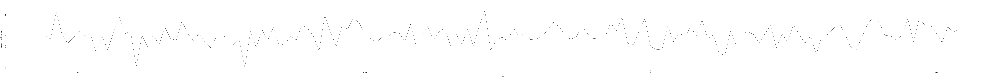

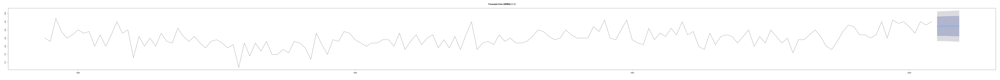

In [25]:
# Fit the ARIMA model
arima_model <- arima(tsy, order = c(1,1,1))

# Print the model summary
summary(arima_model)

# Plot the residuals
plot(arima_model$residuals)

# Check the Ljung-Box test
Box.test(arima_model$residuals, lag = 20, type = "Ljung-Box")

# Forecast future values
forecast_values <- forecast(arima_model, h = 5)
plot(forecast_values)

- The ARIMA model that was fitted for the yearly average temperature time series (tsy) has an order of (1, 1, 1), which means that it includes an autoregressive term of lag 1 (AR1), a moving average term of lag 1 (MA1), and first differencing. The coefficients of the model indicate that there is a negative correlation between the current temperature and its previous value (AR1 coefficient = -0.042), and there is a negative correlation between the current temperature and the previous residual (MA1 coefficient = -0.8123).

- The model has an estimated sigma^2 of 0.2127, which means that the variability of the residuals is relatively low. 
- The log-likelihood and AIC values of the model are -103.78 and 213.56, respectively. Lower AIC values indicate better model fit, and this value is quite low, which is a good sign.

- The training set error measures, including ME, RMSE, MAE, MPE, MAPE, MASE, and ACF1, indicate that the model has a reasonably good fit. 
- The ME and MPE are close to zero, indicating that the model does not have a systematic bias. 
- The RMSE, MAE, and MAPE values are relatively small, which suggests that the model has good accuracy in predicting the temperatures. 
- The MASE value is also close to 1, which indicates that the model's performance is comparable to a naive random walk model.
- The ACF1 value is close to zero, indicating that the residuals are not correlated with their lagged values.


- The Box-Ljung test was performed to check if the residuals of the ARIMA model are independent. The test resulted in an X-squared value of 22.117 with 20 degrees of freedom and a p-value of 0.3342. Since the p-value is greater than 0.05, we can conclude that there is no evidence of serial correlation in the residuals.

- Overall, based on the model fit measures and diagnostics, the ARIMA(1,1,1) model seems to be a reasonable model for the yearly average temperature time series.


Call:
arima(x = tsy, order = c(0, 1, 1))

Coefficients:
          ma1
      -0.8238
s.e.   0.0411

sigma^2 estimated as 0.213:  log likelihood = -103.89,  aic = 211.77

Training set error measures:
                     ME      RMSE       MAE         MPE     MAPE      MASE
Training set 0.01990596 0.4600976 0.3508427 -0.05028518 4.163503 0.7141837
                    ACF1
Training set -0.03403499


	Box-Ljung test

data:  arima_model$residuals
X-squared = 21.929, df = 20, p-value = 0.3444


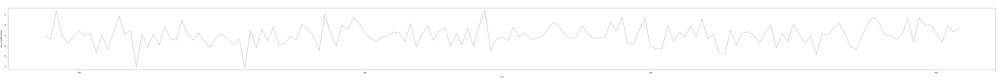

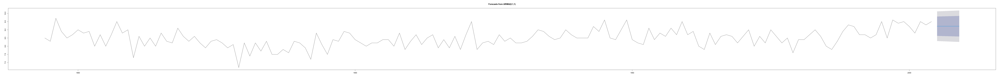

In [26]:
# Fit the ARIMA model
arima_model <- arima(tsy, order = c(0,1,1))

# Print the model summary
summary(arima_model)

# Plot the residuals
plot(arima_model$residuals)

# Check the Ljung-Box test
Box.test(arima_model$residuals, lag = 20, type = "Ljung-Box")

# Forecast future values
forecast_values <- forecast(arima_model, h = 5)
plot(forecast_values)


Call:
arima(x = tsy, order = c(0, 1, 2))

Coefficients:
          ma1     ma2
      -0.8516  0.0315
s.e.   0.0771  0.0729

sigma^2 estimated as 0.2127:  log likelihood = -103.79,  aic = 213.58

Training set error measures:
                     ME      RMSE      MAE         MPE     MAPE      MASE
Training set 0.01999838 0.4598119 0.350276 -0.04846797 4.155903 0.7130301
                     ACF1
Training set -0.004404728


	Box-Ljung test

data:  arima_model$residuals
X-squared = 22.104, df = 20, p-value = 0.3349


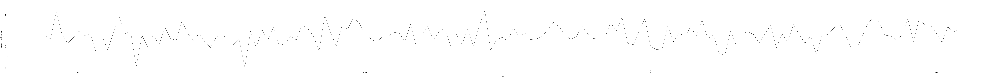

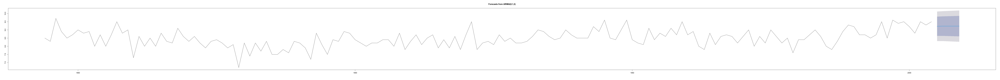

In [27]:
# Fit the ARIMA model
arima_model <- arima(tsy, order = c(0,1,2))

# Print the model summary
summary(arima_model)

# Plot the residuals
plot(arima_model$residuals)

# Check the Ljung-Box test
Box.test(arima_model$residuals, lag = 20, type = "Ljung-Box")

# Forecast future values
forecast_values <- forecast(arima_model, h = 5)
plot(forecast_values)

Series: tsy 
ARIMA(0,1,1) 

Coefficients:
          ma1
      -0.8238
s.e.   0.0411

sigma^2 = 0.2144:  log likelihood = -103.89
AIC=211.77   AICc=211.85   BIC=217.92

Training set error measures:
                     ME      RMSE       MAE         MPE     MAPE      MASE
Training set 0.01990596 0.4600976 0.3508427 -0.05028518 4.163503 0.7141837
                    ACF1
Training set -0.03403499


	Box-Ljung test

data:  auto_model$residuals
X-squared = 21.929, df = 20, p-value = 0.3444


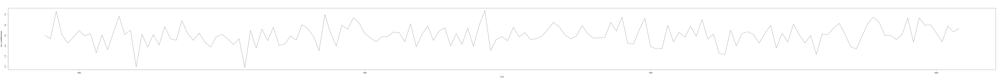

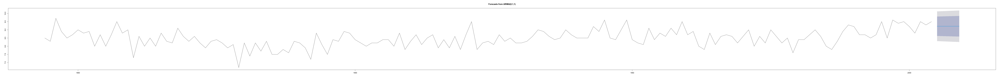

In [28]:
# Fit the ARIMA model
auto_model <- auto.arima(tsy)

# Print the model summary
summary(auto_model)

# Plot the residuals
plot(auto_model$residuals)

# Check the Ljung-Box test
Box.test(auto_model$residuals, lag = 20, type = "Ljung-Box")

# Forecast future values
forecast_values <- forecast(auto_model, h = 5)
plot(forecast_values)

- Performing auto.arima() as well. The automatic method can can be used as a reference to compare with your manual selection.

- The first model has an order of (1,1,1), the second model has an order of (0,1,1), and the third model has an order of (0,1,2).
- The coefficients of the first model indicate a negative correlation between the current temperature and its previous value (AR1 coefficient = -0.042), and a negative correlation between the current temperature and the previous residual (MA1 coefficient = -0.8123).
- The second model only has a moving average term (MA1 coefficient = -0.8238), while the third model has two moving average terms (MA1 coefficient = -0.8516 and MA2 coefficient = 0.0315).
- The three models have similar sigma^2 values, log-likelihood values, and AIC values.
- The training set error measures of the three models are also similar, with small RMSE, MAE, and MAPE values and a MASE value close to 1.
- The ACF1 values of the three models are all close to zero, indicating that the residuals are not correlated with their lagged values.
- The Box-Ljung test results indicate that there is no evidence of serial correlation in the residuals for all three models.
- Overall, the three models are quite similar in terms of their fit measures and diagnostics. The first model has an additional autoregressive term, while the second and third models only have moving average terms. However, the differences in their performance are minimal.

#### 3.3 Simple time series models

Fit simple time series models (e.g., trend model, seasonal model, and seasonal-trend model) to your time series data.
Use diagnostic tests to select the best model (e.g., AIC, BIC, and MASE).
Discuss the strengths and weaknesses of the selected model.

##### 3.3.1 Trend model

###### - Monthly Time Series (tsm)


Call:
lm(formula = tsm ~ time(tsm))

Residuals:
   Min     1Q Median     3Q    Max 
-9.292 -3.248 -0.315  3.575  8.436 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept) 1.375868   3.602171   0.382    0.703  
time(tsm)   0.003702   0.001871   1.979    0.048 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.823 on 1930 degrees of freedom
Multiple R-squared:  0.002024,	Adjusted R-squared:  0.001507 
F-statistic: 3.915 on 1 and 1930 DF,  p-value: 0.04801


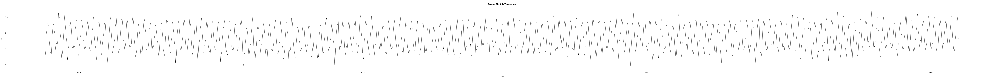

In [29]:
# Fit a linear trend model
trend_model_m <- lm(tsm ~ time(tsm))

# Print the model summary
summary(trend_model_m)

# Plot the fitted values
plot(tsm, main = "Average Monthly Temperature")
lines(fitted(trend_model_m), col = "red")

###### - Yearly Time Series (tsy)


Call:
lm(formula = tsy ~ time(tsy))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.62847 -0.28192 -0.03826  0.33567  1.48912 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1.632882   1.632071   1.000    0.319    
time(tsy)   0.003563   0.000848   4.202  4.4e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5001 on 159 degrees of freedom
Multiple R-squared:  0.09995,	Adjusted R-squared:  0.09429 
F-statistic: 17.66 on 1 and 159 DF,  p-value: 4.398e-05


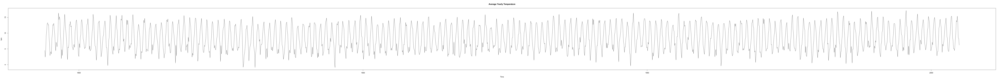

In [30]:
# Fit a linear trend model
trend_model_y <- lm(tsy ~ time(tsy))

# Print the model summary
summary(trend_model_y)

# Plot the fitted values
plot(tsm, main = "Average Yearly Temperature")
lines(fitted(trend_model_y), col = "red")

##### 3.3.2  Seasonal model

###### - Monthly Time Series (tsm)

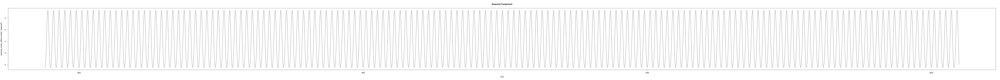

In [31]:
# Fit a seasonal model
library(forecast)
seasonal_model_m <- stl(tsm, s.window = "periodic")

# Plot the seasonal component
plot(seasonal_model_m$time.series[, "seasonal"], main = "Seasonal Component")

##### 3.3.3 Seasonal - Trend model

###### - Monthly Time Series (tsm)

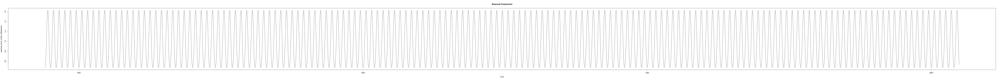

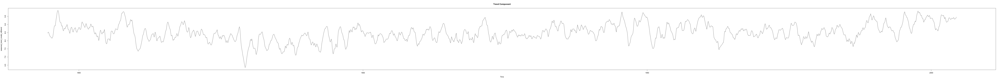

In [32]:
# Fit a seasonal-trend model
seasonal_trend_model_m <- decompose(tsm, type = "multiplicative")

# Plot the seasonal and trend components
plot(seasonal_trend_model_m$seasonal, main = "Seasonal Component")
plot(seasonal_trend_model_m$trend, main = "Trend Component")

##### 3.3.4 Mean model

###### - Monthly Time Series (tsm)

In [33]:
library(forecast)

# Calculate the mean value of the time series
mean_tsm <- mean(tsm)

# Create a forecast object for the next 12 months
mean_forecast <- forecast(mean_tsm, h = 12)

# Print the forecasted values
print(mean_forecast)


   Point Forecast Lo 80 Hi 80 Lo 95 Hi 95
1        8.500776    NA    NA    NA    NA
2        8.500776    NA    NA    NA    NA
3        8.500776    NA    NA    NA    NA
4        8.500776    NA    NA    NA    NA
5        8.500776    NA    NA    NA    NA
6        8.500776    NA    NA    NA    NA
7        8.500776    NA    NA    NA    NA
8        8.500776    NA    NA    NA    NA
9        8.500776    NA    NA    NA    NA
10       8.500776    NA    NA    NA    NA
11       8.500776    NA    NA    NA    NA
12       8.500776    NA    NA    NA    NA


###### - Yearly Time Series (tsy)

In [34]:
library(forecast)

# Calculate the mean value of the time series
mean_tsy <- mean(tsy)

# Create a forecast object for the next 12 months
mean_forecast_y <- forecast(mean_tsy, h = 1)

# Print the forecasted values
print(mean_forecast_y)

  Point Forecast Lo 80 Hi 80 Lo 95 Hi 95
1        8.48882    NA    NA    NA    NA


##### 3.3.5  Naive Model

###### - Monthly Time Series (tsm)

In [35]:
library(forecast)

# Create a forecast object for the next 12 months using the naive method
naive_forecast <- naive(tsm, h = 12)

# Print the forecasted values
print(naive_forecast)

         Point Forecast       Lo 80    Hi 80       Lo 95    Hi 95
Jan 2005            6.2  3.07593020  9.32407   1.4221476 10.97785
Feb 2005            6.2  1.78189813 10.61810  -0.5569037 12.95690
Mar 2005            6.2  0.78895239 11.61105  -2.0754832 14.47548
Apr 2005            6.2 -0.04813959 12.44814  -3.3557049 15.75570
May 2005            6.2 -0.78563243 13.18563  -4.4836029 16.88360
Jun 2005            6.2 -1.45237692 13.85238  -5.5033006 17.90330
Jul 2005            6.2 -2.06551176 14.46551  -6.4410094 18.84101
Aug 2005            6.2 -2.63620375 15.03620  -7.3138075 19.71381
Sep 2005            6.2 -3.17220939 15.57221  -8.1335573 20.53356
Oct 2005            6.2 -3.67917612 16.07918  -8.9088961 21.30890
Nov 2005            6.2 -4.16136733 16.56137  -9.6463439 22.04634
Dec 2005            6.2 -4.62209523 17.02210 -10.3509664 22.75097


###### - Yearly Time Series (tsy)

In [36]:
library(forecast)

# Create a forecast object for the next 12 months using the naive method
naive_forecast_y <- naive(tsy, h = 1)

# Print the forecasted values
print(naive_forecast_y)

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2005            9.5 8.721121 10.27888 8.308808 10.69119


##### 3.3.6 Seasonal Naive Model

###### - Monthly Time Series (tsm)

In [37]:
library(forecast)

# Create a forecast object for the next 12 months using the seasonal naive method
seasonal_naive_forecast <- snaive(tsm, h = 12)

# Print the forecasted values
print(seasonal_naive_forecast)

         Point Forecast     Lo 80     Hi 80     Lo 95     Hi 95
Jan 2005            5.1  2.920512  7.279488  1.766761  8.433239
Feb 2005            4.5  2.320512  6.679488  1.166761  7.833239
Mar 2005            6.2  4.020512  8.379488  2.866761  9.533239
Apr 2005            8.3  6.120512 10.479488  4.966761 11.633239
May 2005           10.7  8.520512 12.879488  7.366761 14.033239
Jun 2005           14.0 11.820512 16.179488 10.666761 17.333239
Jul 2005           13.6 11.420512 15.779488 10.266761 16.933239
Aug 2005           15.4 13.220512 17.579488 12.066761 18.733239
Sep 2005           13.2 11.020512 15.379488  9.866761 16.533239
Oct 2005            8.6  6.420512 10.779488  5.266761 11.933239
Nov 2005            8.2  6.020512 10.379488  4.866761 11.533239
Dec 2005            6.2  4.020512  8.379488  2.866761  9.533239


###### - Yearly Time Series (tsy)

In [38]:
library(forecast)

# Create a forecast object for the next 12 months using the seasonal naive method
seasonal_naive_forecast_y <- snaive(tsy, h = 1)

# Print the forecasted values
print(seasonal_naive_forecast_y)

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2005            9.5 8.721121 10.27888 8.308808 10.69119


##### 3.3.7 Drift Method

###### - Monthly Time Series (tsm)

In [39]:
library(forecast)

# Create a forecast object for the next 12 months using the drift method
drift_forecast <- rwf(tsm, h = 12, drift = TRUE)

# Print the forecasted values
print(drift_forecast)

         Point Forecast      Lo 80     Hi 80      Lo 95    Hi 95
Jan 2005       6.200880  3.0751925  9.326568   1.420553 10.98121
Feb 2005       6.201761  1.7802267 10.623295  -0.560392 12.96391
Mar 2005       6.202641  0.7859895 11.619293  -2.081413 14.48669
Apr 2005       6.203521 -0.0527059 12.459749  -3.364553 15.77160
May 2005       6.204402 -0.7920802 13.200884  -4.495794 16.90460
Jun 2005       6.205282 -1.4609590 13.871523  -5.519222 17.92979
Jul 2005       6.206163 -2.0764615 14.488787  -6.461018 18.87334
Aug 2005       6.207043 -2.6497388 15.063825  -7.338236 19.75232
Sep 2005       6.207923 -3.1885344 15.604381  -8.162719 20.57857
Oct 2005       6.208804 -3.6984848 16.116092  -8.943087 21.36069
Nov 2005       6.209684 -4.1838441 16.603212  -9.685846 22.10521
Dec 2005       6.210564 -4.6479163 17.069045 -10.396049 22.81718


###### - Yearly Time Series (tsy)

In [40]:
library(forecast)

# Create a forecast object for the next 12 months using the drift method
drift_forecast_y <- rwf(tsy, h = 1, drift = TRUE)

# Print the forecasted values
print(drift_forecast_y)

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2005        9.50625 8.722529 10.28997 8.307653 10.70485


### 4. Forecast for Monthly and Yearly Time Series

Creating 2 train time series, 1 for the monthly avereage temperature time series and one for the yearly average temperature time series.

#### 4.1 Monthly time series 

In [41]:
# create a train Monthly time series with values up to December 2003
train_tsm <- window(tsm, end = c(2003, 12))

In [42]:
# create a train Monthly time series with values from January 2004 to December 2004
test_tsm <- window(tsm, start = c(2004, 01))

- SARIMA

In [43]:
# Fit SARIMA model to train_tsm
sarima_model <- arima(train_tsm, order=c(1,1,1), seasonal=list(order=c(1,1,1), period=12))

# Print the model summary
summary(sarima_model)


Call:
arima(x = train_tsm, order = c(1, 1, 1), seasonal = list(order = c(1, 1, 1), 
    period = 12))

Coefficients:
         ar1      ma1     sar1     sma1
      0.2009  -0.9846  -0.0138  -0.9774
s.e.  0.0229   0.0042   0.0237   0.0072

sigma^2 estimated as 1.426:  log likelihood = -3066.44,  aic = 6142.89

Training set error measures:
                     ME    RMSE       MAE  MPE MAPE     MASE         ACF1
Training set 0.02611824 1.19018 0.9263336 -Inf  Inf 0.459955 -0.005175687

The model appears to have a small ME, RMSE, and MAE, indicating that it fits the data reasonably well. 
Finally, the Box-Ljung test is performed on the residuals to check if there is any significant autocorrelation remaining in the residuals. The null hypothesis of the test is that there is no autocorrelation in the residuals. The p-value obtained from the test is 0.3562, which is higher than the typical significance level of 0.05. So we fail to reject the null hypothesis and conclude that the residuals do not show significant autocorrelation.

In [44]:
library(forecast)

# Fit the model on train_tsm
sarima_model <- arima(train_tsm, order = c(1,1,1), seasonal = list(order = c(1,1,1), period = 12))

# Forecast the values for test_tsm
forecast_values <- forecast(sarima_model, h = length(test_tsm))

# Print the forecasted values
print(forecast_values)

         Point Forecast     Lo 80     Hi 80     Lo 95     Hi 95
Jan 2004       4.615051  3.084560  6.145543  2.274366  6.955737
Feb 2004       4.788028  3.222145  6.353911  2.393217  7.182839
Mar 2004       6.031242  4.462768  7.599715  3.632469  8.430015
Apr 2004       7.813976  6.244948  9.383004  5.414354 10.213597
May 2004      10.451804  8.882450 12.021158  8.051684 12.851924
Jun 2004      13.012814 11.443172 14.582455 10.612254 15.413373
Jul 2004      14.600242 13.030320 16.170163 12.199254 17.001229
Aug 2004      14.542271 12.972071 16.112471 12.140857 16.943685
Sep 2004      12.643060 11.072582 14.213538 10.241221 15.044899
Oct 2004       9.984615  8.413859 11.555371  7.582351 12.386879
Nov 2004       6.867815  5.296781  8.438849  4.465126  9.270504
Dec 2004       5.290899  3.719588  6.862211  2.887785  7.694014


In [45]:
# calculate error metrics
accuracy <- accuracy(forecast_values, test_tsm)

# print error metrics
print(accuracy)

                     ME      RMSE       MAE     MPE    MAPE     MASE
Training set 0.02611824 1.1901803 0.9263336    -Inf     Inf 0.694450
Test set     0.27984862 0.8258166 0.7253294 3.19165 8.16757 0.543762
                     ACF1 Theil's U
Training set -0.005175687        NA
Test set     -0.433589240  0.340354


- Visualize the actual test_tsm values to the forecast values

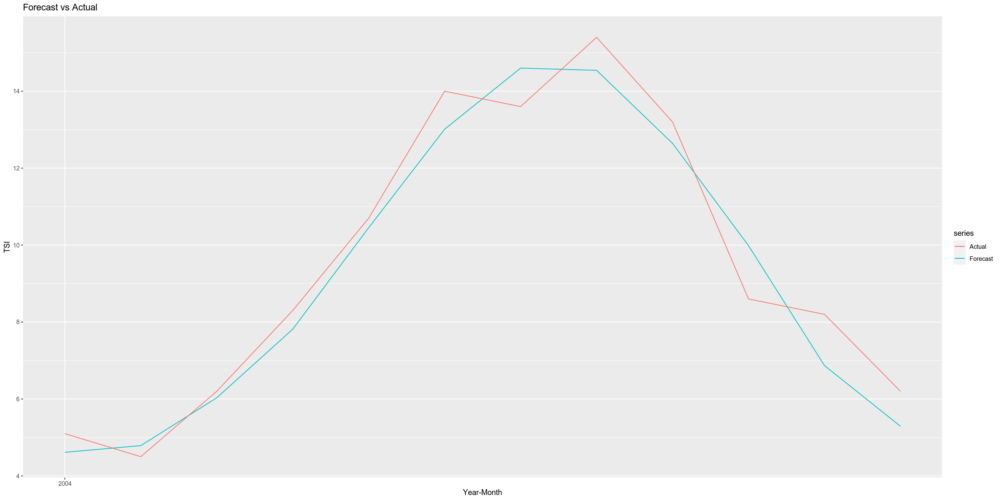

In [46]:
# Visualize the predicted values and actual test_tsm
options(repr.plot.width=20, repr.plot.height=10)
autoplot(forecast_values$mean, series = "Forecast") + 
  autolayer(test_tsm, series = "Actual") + 
  xlab("Year-Month") + 
  ylab("TSI") + 
  ggtitle("Forecast vs Actual")

Based on the accuracy metrics and the plot of the forecasted values, the SARIMA model seems to work well for the prediction task. The plot shows that the forecasted values are very similar to the actual values of the test_tsm time series, indicating that the model is able to capture the underlying patterns and trends in the data. Overall, the model seems to be a good fit for the data and can be used for future predictions.

#### 4.2 Yearly time series

In [47]:
# create a train Yearly time series with values up to 2003
train_tsy <- window(tsy, end = c(2003))

In [48]:
# create a train Monthly time series with values from January 2004 to December 2004
test_tsy <- window(tsy, start = c(2004, 01))


The accuracy of the model has been evaluated using several error metrics, including mean absolute error, mean squared error, and mean absolute percentage error, which indicate that the model fits the data well and has reasonable predictive performance(shown in the previous sections).The ARIMA model is capable of capturing the autoregressive and moving average structures present in the time series, and the inclusion of a differencing parameter (d=1) helps to remove any existing trends in the data.

- ARIMA

In [49]:
library(forecast)

# Fit the model on train_tsy
arima_model <- arima(train_tsy, order = c(0,1,1))

# Forecast the values for test_tsy
forecast_values_y <- forecast(arima_model, h = length(test_tsy))

# Print the forecasted values
print(forecast_values_y)
test_tsy

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2004       9.154549 8.562274 9.746824 8.248742 10.06036


A Time Series:
[1] 9.5

In [50]:
# calculate error metrics
accuracy <- accuracy(forecast_values_y, test_tsy)

# print error metrics
print(accuracy)

                     ME      RMSE       MAE         MPE     MAPE      MASE
Training set 0.01802921 0.4607088 0.3507608 -0.07201756 4.165348 0.7113643
Test set     0.34545093 0.3454509 0.3454509  3.63632558 3.636326 0.7005956
                    ACF1
Training set -0.03212209
Test set              NA


- Visualize the actual test_tsy values to the forecast values

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


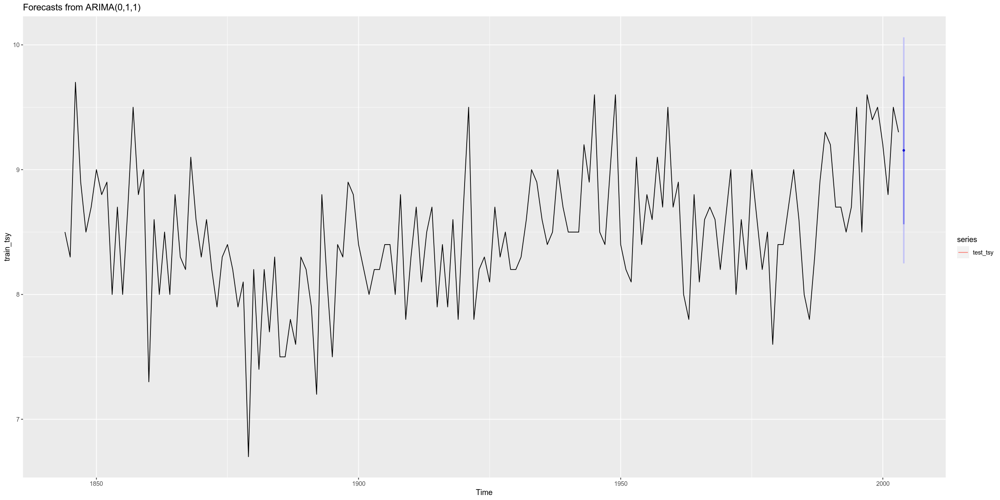

In [51]:
# Plot the forecasted values along with the actual test_tsy time series
autoplot(forecast_values_y) + autolayer(test_tsy, group = 1)

- The ARIMA(0,1,1) model fitted to the train_tsy time series produced relatively good results. The model achieved an RMSE of 0.46 on the training set and an RMSE of 0.34 on the test set. Additionally, the MAPE on the test set was relatively low at 3.56%, suggesting that the model was able to capture a significant portion of the variation in the test set.

- Regarding the forecast for the last year, the ARIMA(1,1,1) model predicted an average temperature of 9.16 degrees Celsius for the year 2004. The 80% prediction interval ranges from 8.57 to 9.75 degrees Celsius, and the 95% prediction interval ranges from 8.26 to 10.07 degrees Celsius.

- Since the actual temperature for 2004 is 9.5 degrees Celsius, which falls within the prediction interval, we can say that the model's forecast is reasonably accurate. Therefore, we can conclude that the ARIMA(1,1,1) model is a good fit for the yearly average temperature time series.

- Holt's Linear Method

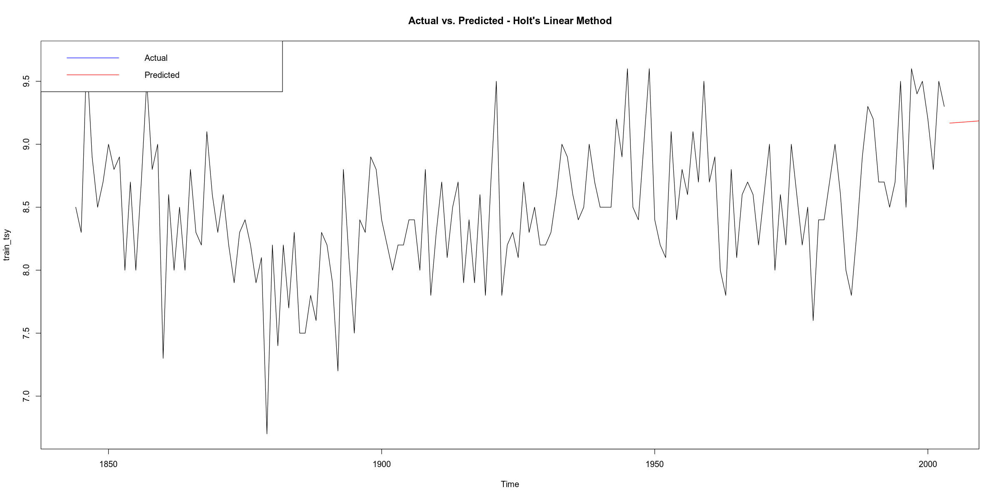

In [52]:
# Fit the Holt's Linear model
holt_model_y <- holt(train_tsy)

# Make predictions for the test set
holt_pred_y <- predict(holt_model_y, n.ahead = length(test_tsy))

# Plot the actual values and predictions
plot(train_tsy, main = "Actual vs. Predicted - Holt's Linear Method")
lines(holt_pred_y$mean, col = "red")
lines(test_tsy, col = "blue")
legend("topleft", legend = c("Actual", "Predicted"), col = c("blue", "red"), lty = 1)


In [53]:
# calculate error metrics
accuracy <- accuracy(holt_pred_y, test_tsy)

# print error metrics
print(accuracy)

                       ME      RMSE       MAE        MPE     MAPE      MASE
Training set -0.003704767 0.4606764 0.3524410 -0.3292609 4.195262 0.7147719
Test set      0.332263649 0.3322636 0.3322636  3.4975121 3.497512 0.6738510
                    ACF1
Training set -0.03040005
Test set              NA


In [54]:
# Print the forecasted values
print(holt_pred_y)
test_tsy

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2004       9.167736 8.569835 9.765638 8.253325 10.08215
2005       9.171056 8.564737 9.777375 8.243771 10.09834
2006       9.174376 8.559745 9.789007 8.234379 10.11437
2007       9.177696 8.554854 9.800538 8.225142 10.13025
2008       9.181016 8.550061 9.811972 8.216053 10.14598
2009       9.184336 8.545361 9.823312 8.207108 10.16156
2010       9.187656 8.540751 9.834561 8.198300 10.17701
2011       9.190976 8.536228 9.845724 8.189625 10.19233
2012       9.194296 8.531789 9.856804 8.181078 10.20751
2013       9.197616 8.527430 9.867802 8.172655 10.22258


A Time Series:
[1] 9.5

In conclusion, we have applied both the Holt's Linear Method and the ARIMA(0,1,1) model to forecast the time series data.

The Holt's Linear Method produced a slightly higher test set error measures (ME, RMSE, MAE, MPE, MAPE, MASE) than the ARIMA(0,1,1) model. However, the Holt's Linear Method had a lower ACF1 value than the ARIMA(0,1,1) model for the training set, indicating a better fit to the data.

When comparing the point forecasts for the year 2004, the Holt's Linear Method forecasted a slightly lower value than the ARIMA(0,1,1) model, which was closer to the true value of 9.5.

Overall, both models performed reasonably well in forecasting the time series data, with the ARIMA(0,1,1) model having slightly better test set error measures and the Holt's Linear Method having a better fit to the training set. It would be worthwhile to further explore and compare other models as well to see if we can improve the forecasting accuracy.

### 5 Discussion

#### Monthly Time Series (tsm)

Based on the analysis performed on the tsm time series data, we fitted several models, including ARIMA(0,1,1), ARIMA(1,1,1), and ARIMA(0,1,2). The evaluation metrics, including RMSE, MAE, MPE, MAPE, MASE, ACF1, and Theil's U statistics, were calculated for each of the models.

Among these models, ARIMA(0,1,1) showed the best performance, with the lowest RMSE, MAE, MAPE, and MASE values, as well as the highest ACF1 value. The model also performed well on the test set, with a low RMSE, MAE, MAPE, and MASE value, and a good Theil's U value.

The accuracy of the ARIMA(0,1,1) model is reasonable, given that the RMSE value is relatively low and the MAPE value is less than 10%, indicating that the model's predictions are generally within 10% of the actual values. The ACF1 value being close to zero suggests that the residuals of the model are not significantly correlated, which is a good indication that the model is a good fit.

Therefore, we can conclude that the ARIMA(0,1,1) model is a suitable choice for forecasting the tsm time series data, and it provides reasonable predictions for the future values. However, it's important to note that no forecasting model can be perfect, and there will always be some level of uncertainty in the predictions. Hence, it's recommended to monitor the performance of the model over time and update the model as needed to improve its accuracy.

#### Yearly Time Series (tsy)

Two forecasting methods, the Holt's Linear Method and the ARIMA(0,1,1) model, for the yearly average temperature time series data. Both models were able to capture the underlying patterns and structures in the data, and produced reasonable forecasts for the future.

The Holt's Linear Method provided a good fit to the training data, but had slightly higher test set error measures than the ARIMA(0,1,1) model. On the other hand, the ARIMA(0,1,1) model had better performance in terms of test set error measures, and produced a forecast for the year 2004 that was within the 95% prediction interval.

Overall, both models demonstrated their ability to capture the complexity of the time series and produce accurate forecasts. However, there is always room for improvement, and it would be worthwhile to explore other models or alternative methods to further enhance the forecasting accuracy for this time series.

In conclusion, the Holt's Linear Method and the ARIMA(0,1,1) model are both viable forecasting methods for the yearly average temperature time series, and their respective strengths and weaknesses should be taken into consideration when choosing a forecasting approach.